Customer Personality Analysis
---

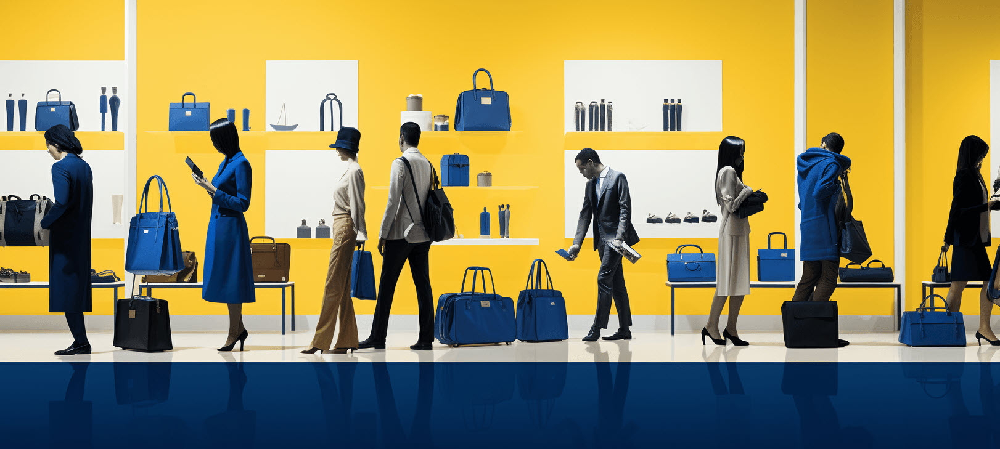

In [1]:
from IPython.display import Image
Image(filename='pics/12.jpg')

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


import datetime
import matplotlib
from matplotlib import colors
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics
from scipy.cluster.hierarchy import linkage 
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN 
from sklearn.metrics import silhouette_samples
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
np.random.seed(42)

In [4]:
customer  = pd.read_csv('marketing_campaign.csv',sep='\t')
customer.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [5]:
customer["Dt_Customer"] = pd.to_datetime(customer["Dt_Customer"])
dates = []
for i in customer["Dt_Customer"]:
    i = i.date()
    dates.append(i)  
#Dates of the newest and oldest recorded customer
print("The newest customer's enrolment date in therecords:",max(dates))
print("The oldest customer's enrolment date in the records:",min(dates))

The newest customer's enrolment date in therecords: 2014-12-06
The oldest customer's enrolment date in the records: 2012-01-08


In [6]:
 
customer["Age"] = 2015-customer["Year_Birth"]

#Total spendings on various items
customer["Spent"] = customer["MntWines"]+ customer["MntFruits"]+ customer["MntMeatProducts"]+ customer["MntFishProducts"]+ customer["MntSweetProducts"]+ customer["MntGoldProds"]

#Deriving living situation by marital status"Alone"
customer["Living_With"]=customer["Marital_Status"].replace({"Married":"Partner", "Together":"Partner", "Absurd":"Alone", "Widow":"Alone", "YOLO":"Alone", "Divorced":"Alone", "Single":"Alone",})

#Feature indicating total children living in the household
customer["Children"]=customer["Kidhome"]+customer["Teenhome"]

#Feature for total members in the householde
customer["Family_Size"] = customer["Living_With"].replace({"Alone": 1, "Partner":2})+ customer["Children"]

#Feature pertaining parenthood
customer["Is_Parent"] = np.where(customer.Children> 0, 1, 0)

#Segmenting education levels in three groups
customer["Education"]=customer["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"})

#For clarity
customer=customer.rename(columns={"MntWines": "Wines","MntFruits":"Fruits","MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets","MntGoldProds":"Gold"})

#Dropping some of the redundant features
to_drop = ["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID"]
customer = customer.drop(to_drop, axis=1)

In [7]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Education            2240 non-null   object 
 1   Income               2216 non-null   float64
 2   Kidhome              2240 non-null   int64  
 3   Teenhome             2240 non-null   int64  
 4   Recency              2240 non-null   int64  
 5   Wines                2240 non-null   int64  
 6   Fruits               2240 non-null   int64  
 7   Meat                 2240 non-null   int64  
 8   Fish                 2240 non-null   int64  
 9   Sweets               2240 non-null   int64  
 10  Gold                 2240 non-null   int64  
 11  NumDealsPurchases    2240 non-null   int64  
 12  NumWebPurchases      2240 non-null   int64  
 13  NumCatalogPurchases  2240 non-null   int64  
 14  NumStorePurchases    2240 non-null   int64  
 15  NumWebVisitsMonth    2240 non-null   i

In [8]:
customer.describe() 

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Spent,Children,Family_Size,Is_Parent
count,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,...,0.072768,0.064286,0.013393,0.009375,0.149107,46.194196,605.798214,0.950446,2.595089,0.715179
std,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,...,0.259813,0.245316,0.114976,0.096391,0.356274,11.984069,602.249288,0.751803,0.906959,0.451430
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,19.000000,5.000000,0.000000,1.000000,0.000000
25%,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,38.000000,68.750000,0.000000,2.000000,0.000000
50%,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,45.000000,396.000000,1.000000,3.000000,1.000000
75%,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,56.000000,1045.500000,1.000000,3.000000,1.000000
max,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,122.000000,2525.000000,3.000000,5.000000,1.000000


In [9]:
education = customer.Education.value_counts()

fig = px.pie(education, 
             values = education.values, 
             names = education.index,
             color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_traces(textposition='inside', textinfo='percent+label', 
                  marker = dict(line = dict(color = 'white', width = 2)))
fig.show()

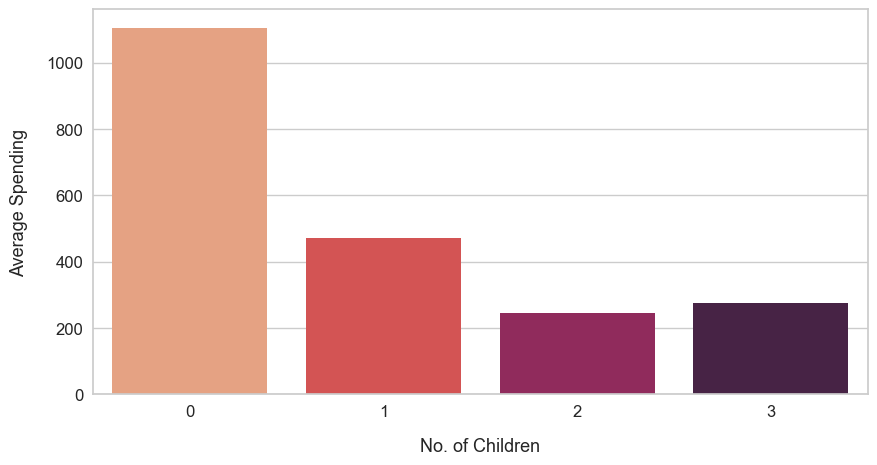

In [10]:
childrenspending = customer.groupby('Children')['Spent'].mean().sort_values(ascending=False)
childrenspending_df = pd.DataFrame(list(childrenspending.items()), columns=['No. of Children', 'Average Spending'])

plt.figure(figsize=(10,5))

sns.barplot(data=childrenspending_df,  x="No. of Children", y="Average Spending", palette='rocket_r');
plt.xticks( fontsize=12)
plt.yticks( fontsize=12)
plt.xlabel('No. of Children', fontsize=13, labelpad=13)
plt.ylabel('Average Spending', fontsize=13, labelpad=13);

Relationship between Income & Spendings

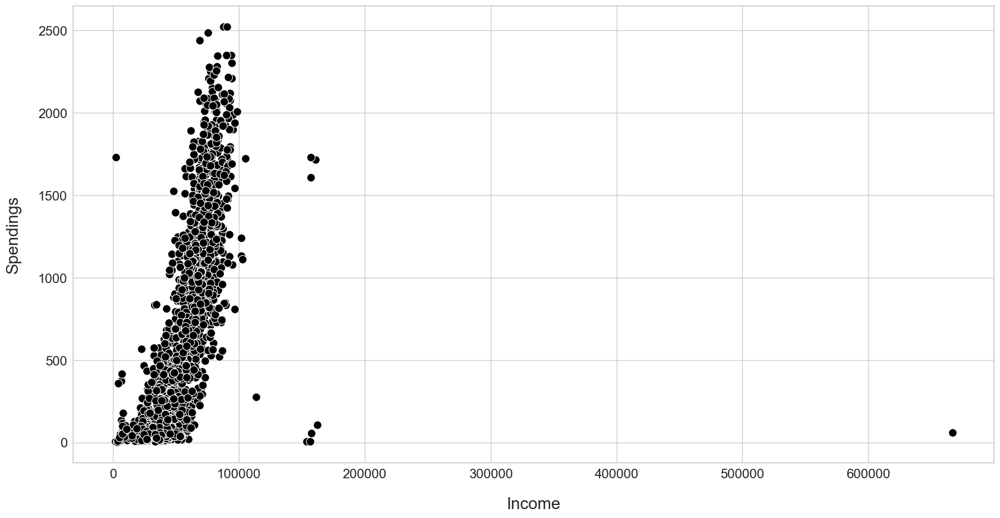

In [11]:
plt.figure(figsize=(20,10))


sns.scatterplot(x=customer.Income, y=customer.Spent, s=100, color='black');

plt.xticks( fontsize=16)
plt.yticks( fontsize=16)
plt.xlabel('Income', fontsize=20, labelpad=20)
plt.ylabel('Spendings', fontsize=20, labelpad=20);

In [12]:
#Created a feature "Customer_For"
days = []
d1 = max(dates) #taking it to be the newest customer
for i in dates:
    delta = d1 - i
    days.append(delta)
customer["Customer_For"] = days
customer["Customer_For"] = pd.to_numeric(customer["Customer_For"], errors="coerce")

In [13]:
#checking duplicated data
customer.duplicated().sum()

185

In [14]:
#checking missing value
customer.isnull().sum()

Education               0
Income                 24
Kidhome                 0
Teenhome                0
Recency                 0
Wines                   0
Fruits                  0
Meat                    0
Fish                    0
Sweets                  0
Gold                    0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Response                0
Age                     0
Spent                   0
Living_With             0
Children                0
Family_Size             0
Is_Parent               0
Customer_For            0
dtype: int64

In [15]:
#remove missing value
customer = customer.dropna()

In [16]:
#removing outliers
customer = customer[customer.Age < 100]
customer = customer[customer.Income < 120000]
data = customer.copy()
data2 = customer.copy()
data3 = customer.copy()

<Axes: >

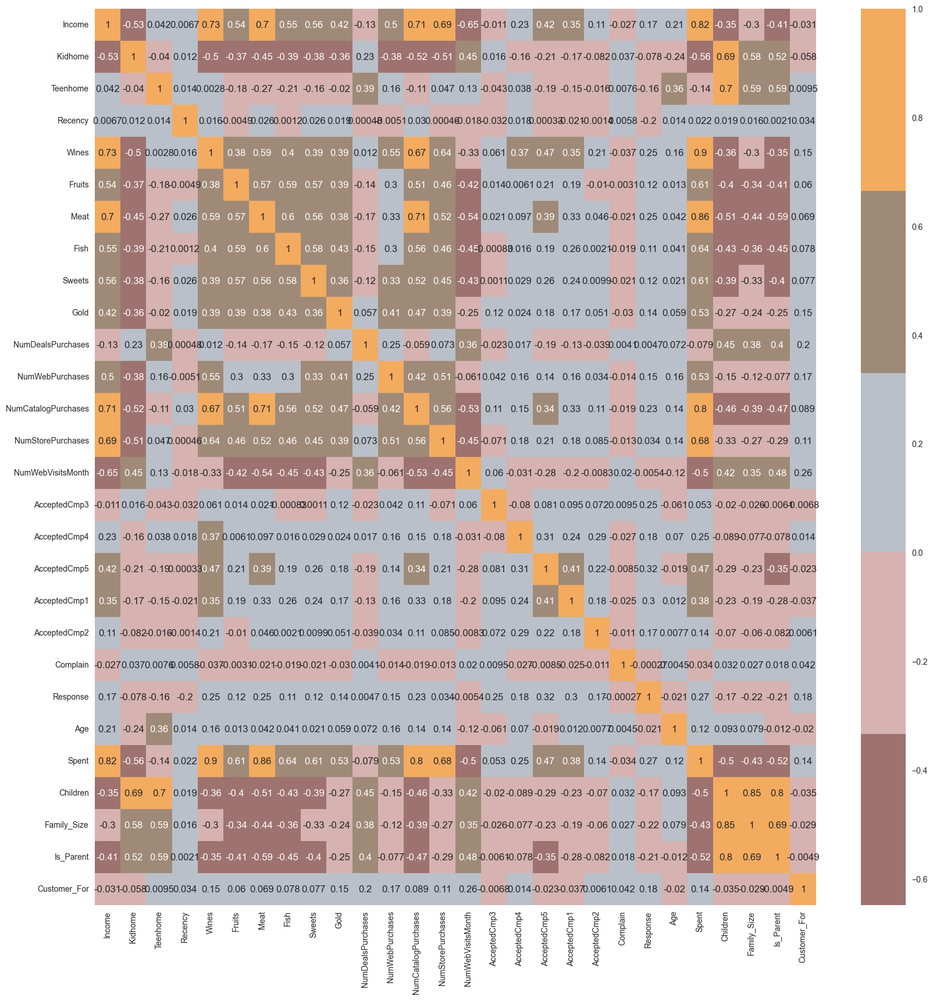

In [17]:
#correlation matrix
corrmat= customer.corr()
cmap = colors.ListedColormap(["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"])
plt.figure(figsize=(20,20))  
sns.heatmap(corrmat,annot=True, cmap=cmap, center=0)

In [18]:
#Get list of categorical variables
s = (customer.dtypes == 'object')
object_cols = list(s[s].index)

print("Categorical variables in the dataset:", object_cols)

Categorical variables in the dataset: ['Education', 'Living_With']


In [19]:
#Label Encoding the object dtypes.
LE=LabelEncoder()
for i in object_cols:
    customer[i]=customer[[i]].apply(LE.fit_transform)
    
print("All features are now numerical")

All features are now numerical


In [20]:
ds = customer.copy()
# creating a subset of dataframe by dropping the features on deals accepted and promotions
cols_del = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response']
ds = ds.drop(cols_del, axis=1)
#Scaling
scaler = StandardScaler()
scaler.fit(ds)
scaled_ds = pd.DataFrame(scaler.transform(ds),columns= ds.columns )
print("All features are now scaled")

All features are now scaled


In [21]:
#Scaled data to be used for reducing the dimensionality
print("Dataframe to be used for further modelling:")
scaled_ds.head()

Dataframe to be used for further modelling:


,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Age,Spent,Living_With,Children,Family_Size,Is_Parent,Customer_For
0,-0.892338,0.314651,-0.823405,-0.930767,0.310830,0.974566,1.548614,1.748400,2.449154,1.480301,...,2.628526,-0.562650,0.689203,1.017189,1.679323,-1.347625,-1.266589,-1.759012,-1.58466,1.974128
1,-0.892338,-0.254877,1.038757,0.906602,-0.380600,-0.874776,-0.638664,-0.731678,-0.652345,-0.635399,...,-0.588043,-1.179732,-0.139645,1.273530,-0.963897,-1.347625,1.403420,0.448513,0.63105,-1.664957
2,-0.892338,0.965354,-0.823405,-0.930767,-0.795458,0.355155,0.568110,-0.175957,1.336263,-0.149031,...,-0.230646,1.288596,-0.554069,0.333612,0.281242,0.742046,-1.266589,-0.655250,-1.58466,-0.172330
3,-0.892338,-1.206087,1.038757,-0.930767,-0.795458,-0.874776,-0.563241,-0.667380,-0.506392,-0.586763,...,-0.945440,-0.562650,0.274779,-1.289883,-0.920675,0.742046,0.068415,0.448513,0.63105,-1.923048
4,0.571654,0.322136,1.038757,-0.930767,1.555404,-0.394659,0.417263,-0.217292,0.150396,-0.003121,...,0.126750,0.054432,-0.139645,-1.033542,-0.307248,0.742046,0.068415,0.448513,0.63105,-0.821859


In [22]:
#Initiating PCA to reduce dimentions aka features to 3
pca = PCA(n_components=3)
pca.fit(scaled_ds)
PCA_ds = pd.DataFrame(pca.transform(scaled_ds), columns=(["col1","col2", "col3"]))
PCA_ds.describe().T
PCA_ds2 = PCA_ds.copy()
PCA_ds3 = PCA_ds.copy()

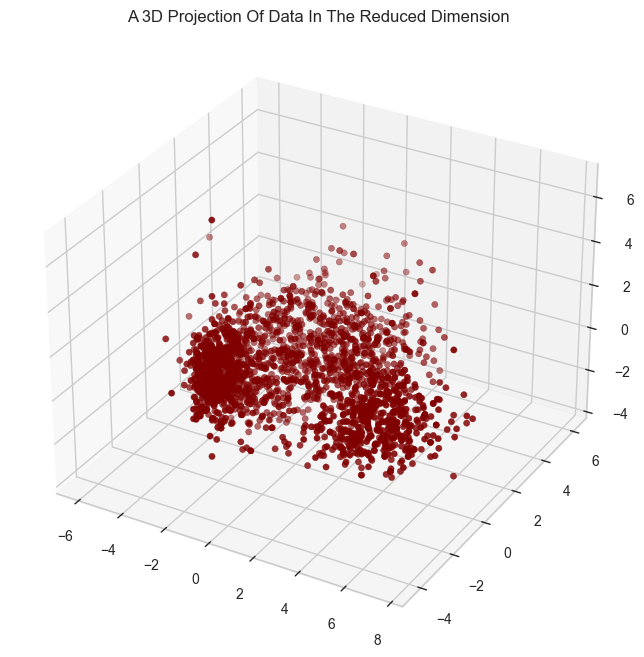

In [23]:
#A 3D Projection Of Data In The Reduced Dimension
x =PCA_ds["col1"]
y =PCA_ds["col2"]
z =PCA_ds["col3"]
#To plot
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

KMeans
---

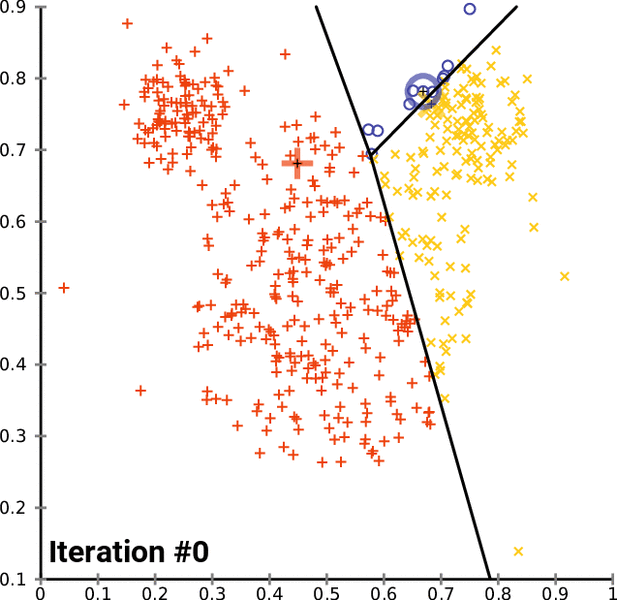

In [24]:
Image(filename='pics/13.gif')

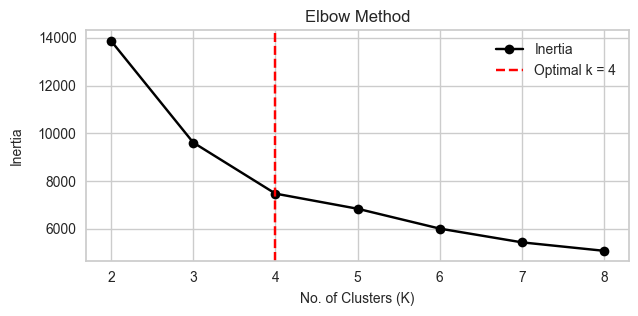

Optimal number of clusters (k): 4


In [41]:
options = range(2, 9)
inertias = []

# Perform k-means for each k and compute inertia
for n_clusters in options:
    model = KMeans(n_clusters=n_clusters, random_state=42).fit(PCA_ds)
    inertias.append(model.inertia_)

# Calculate the "elbow" point (optimal k)
def find_elbow_point(x, y):
    # Line equation: connecting first and last points
    line_start = np.array([x[0], y[0]])
    line_end = np.array([x[-1], y[-1]])
    line_vec = line_end - line_start
    
    # Normalize the line vector
    line_vec_norm = line_vec / np.linalg.norm(line_vec)
    
    # Compute distances from all points to the line
    distances = []
    for i in range(len(x)):
        point = np.array([x[i], y[i]])
        proj_of_point = line_start + np.dot(point - line_start, line_vec_norm) * line_vec_norm
        distances.append(np.linalg.norm(point - proj_of_point))
    
    # Return index of the maximum distance (farthest point)
    return x[np.argmax(distances)]

optimal_k = find_elbow_point(list(options), inertias)

# Plot the elbow curve
plt.figure(figsize=(7, 3))
plt.title("Elbow Method", fontsize=12)
plt.plot(options, inertias, '-o', color='black', label='Inertia')
plt.axvline(optimal_k, linestyle='--', color='red', label=f'Optimal k = {optimal_k}')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('No. of Clusters (K)', fontsize=10, labelpad=5)
plt.ylabel('Inertia', fontsize=10, labelpad=10)
plt.legend(fontsize=10)
plt.grid(True)
plt.show()

print(f"Optimal number of clusters (k): {optimal_k}")


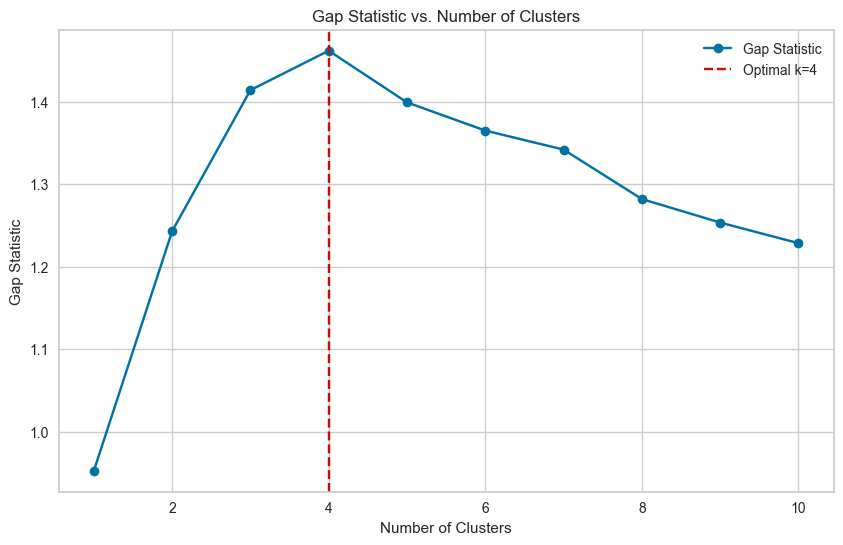

([0.9529345616949936,
  1.2430742228195601,
  1.4139373575237464,
  1.4616057678766783,
  1.3990229990375376,
  1.36490288282776,
  1.3418527081410758,
  1.2819822467765754,
  1.253484485348153,
  1.2285282125592172],
 4)

In [28]:
data = PCA_ds

# Step 2: Define function to calculate WCSS
def calculate_wcss(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data)
    return kmeans.inertia_  # WCSS

# Step 3: Generate random reference datasets
def generate_reference_data(data, n_references=10):
    min_vals = data.min(axis=0)
    max_vals = data.max(axis=0)
    reference_datasets = [np.random.uniform(min_vals, max_vals, size=data.shape) for _ in range(n_references)]
    return reference_datasets

# Step 4: Calculate Gap Statistic
def calculate_gap_statistic(data, max_clusters, n_references=10):
    gaps = []
    wcss_orig = []
    ref_wcss_means = []

    reference_datasets = generate_reference_data(data, n_references=n_references)
    
    for k in range(1, max_clusters + 1):
        # WCSS for original data
        wcss_k = calculate_wcss(data, k)
        wcss_orig.append(np.log(wcss_k))
        
        # WCSS for reference datasets
        ref_wcss = [np.log(calculate_wcss(ref, k)) for ref in reference_datasets]
        ref_wcss_means.append(np.mean(ref_wcss))
        
        # Gap statistic
        gap_k = np.mean(ref_wcss) - np.log(wcss_k)
        gaps.append(gap_k)
    
    return gaps, wcss_orig, ref_wcss_means

# Step 5: Run Gap Statistic Calculation
max_clusters = 10
gaps, wcss_orig, ref_wcss_means = calculate_gap_statistic(data, max_clusters)

# Step 6: Determine the optimal number of clusters
optimal_k = np.argmax(gaps) + 1

# Step 7: Plot the results
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), gaps, marker='o', label='Gap Statistic')
plt.xlabel('Number of Clusters')
plt.ylabel('Gap Statistic')
plt.title('Gap Statistic vs. Number of Clusters')
plt.axvline(x=optimal_k, linestyle='--', color='r', label=f'Optimal k={optimal_k}')
plt.legend()
plt.grid(True)
plt.show()

gaps, optimal_k


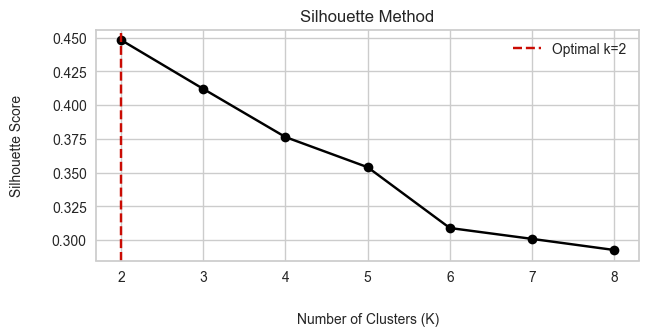

In [42]:
options = range(2, 9)
silhouette_scores = []

for n_clusters in options:
    model = KMeans(n_clusters=n_clusters, random_state=42).fit(PCA_ds)
    labels = model.labels_
    silhouette_avg = silhouette_score(PCA_ds, labels)
    silhouette_scores.append(silhouette_avg)

# Determine the optimal number of clusters
optimal_k = options[np.argmax(silhouette_scores)]

# Plotting the results with the vertical line for the optimal number of clusters
plt.figure(figsize=(7, 3))
plt.plot(options, silhouette_scores, '-o', color='black')
plt.axvline(x=optimal_k, linestyle='--', color='r', label=f'Optimal k={optimal_k}')
plt.title('Silhouette Method')
plt.xlabel('Number of Clusters (K)', fontsize=10, labelpad=20)
plt.ylabel('Silhouette Score', fontsize=10, labelpad=20)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend()
plt.grid(True)
plt.show()


In [40]:
model = KMeans(n_clusters=4, init='k-means++', random_state=42).fit(PCA_ds)

preds = model.predict(PCA_ds)
PCA_ds5 = PCA_ds.copy()
customer_kmeans = PCA_ds.copy()
customer_kmeans['clusters'] = preds
customer['clusters']= preds
PCA_ds5['clusters']= preds

In [37]:
customer['clusters']

0       0
1       3
2       0
3       1
4       3
       ..
2235    2
2236    3
2237    0
2238    2
2239    3
Name: clusters, Length: 2205, dtype: int32

In [41]:
score = silhouette_score(PCA_ds5, PCA_ds5['clusters'], metric='euclidean')
score

0.4444034095383782

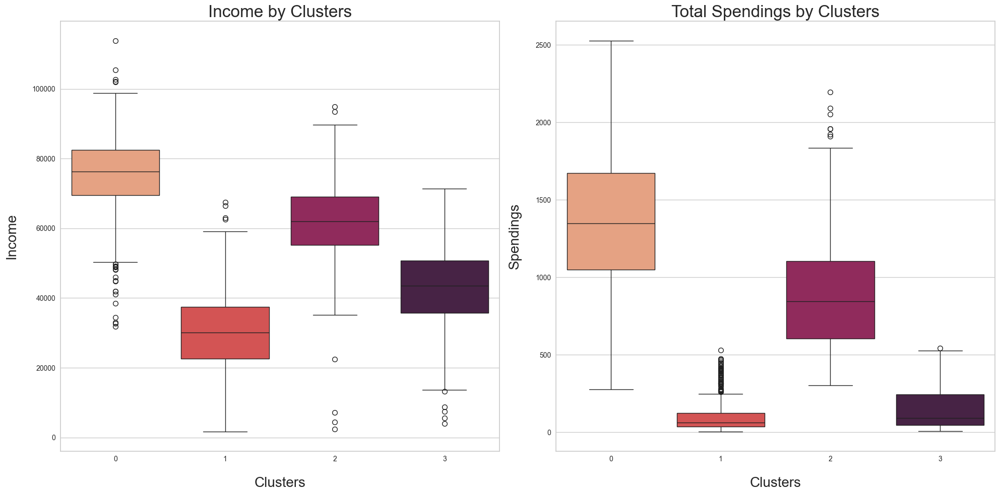

In [29]:
plt.figure(figsize=(20, 10))

# Boxplot for Income by clusters
plt.subplot(1, 2, 1)
sns.boxplot(data=customer, x='clusters', y='Income', palette='rocket_r')
plt.xlabel('Clusters', fontsize=20, labelpad=20)
plt.ylabel('Income', fontsize=20, labelpad=20)
plt.title('Income by Clusters', fontsize=24)

# Boxplot for Total Spending by clusters
plt.subplot(1, 2, 2)
sns.boxplot(data=customer, x='clusters', y='Spent', palette='rocket_r')
plt.xlabel('Clusters', fontsize=20, labelpad=20)
plt.ylabel('Spendings', fontsize=20, labelpad=20)
plt.title('Total Spendings by Clusters', fontsize=24)

plt.tight_layout()
plt.show()


In [30]:
cluster_counts = customer.clusters.value_counts()

fig = px.pie(cluster_counts, 
             values = cluster_counts.values, 
             names = cluster_counts.index,
             color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_traces(textposition='inside', textinfo='percent+label', textfont_size=20,
                  marker = dict(line = dict(color = 'white', width = 2)))
fig.show()

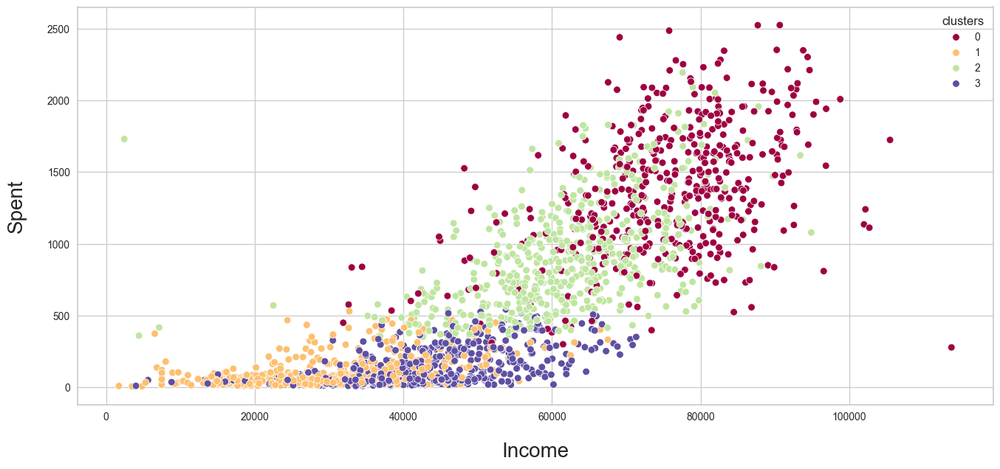

In [31]:
plt.figure(figsize=(16,7))
sns.scatterplot(data=customer, x='Income', y='Spent', hue='clusters', palette='Spectral');
plt.xlabel('Income', fontsize=20, labelpad=20)
plt.ylabel('Spent', fontsize=20, labelpad=20);

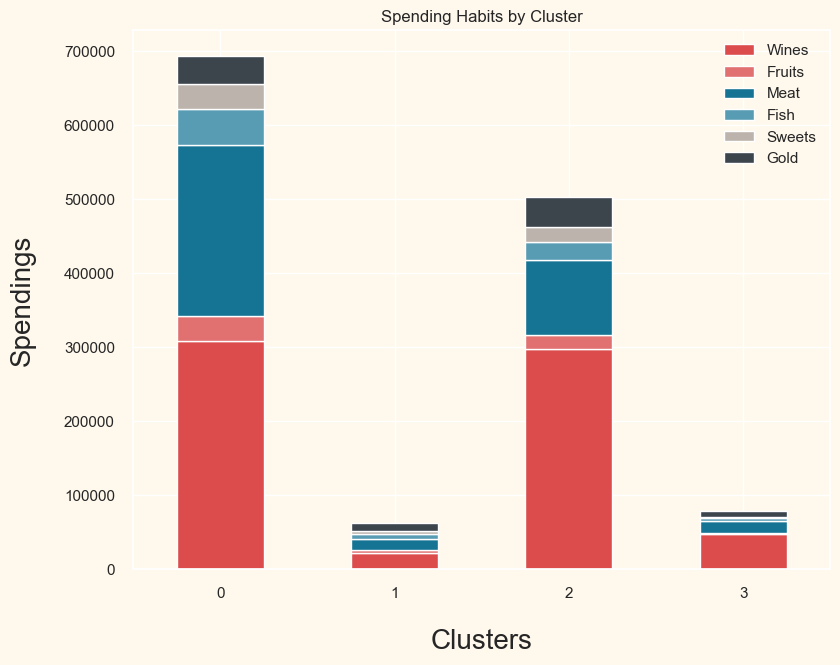

In [ ]:
cluster_spendings = customer.groupby('clusters')[['Wines', 'Fruits','Meat', 
                                                  'Fish', 'Sweets', 'Gold']].sum()

cluster_spendings.plot(kind='bar', stacked=True, figsize=(9,7), color=['#dc4c4c','#e17070','#157394','#589cb4','#bcb4ac','#3c444c'])

plt.title('Spending Habits by Cluster')
plt.xlabel('Clusters', fontsize=20, labelpad=20)
plt.ylabel('Spendings', fontsize=20, labelpad=20)
plt.xticks(rotation=0, ha='center')

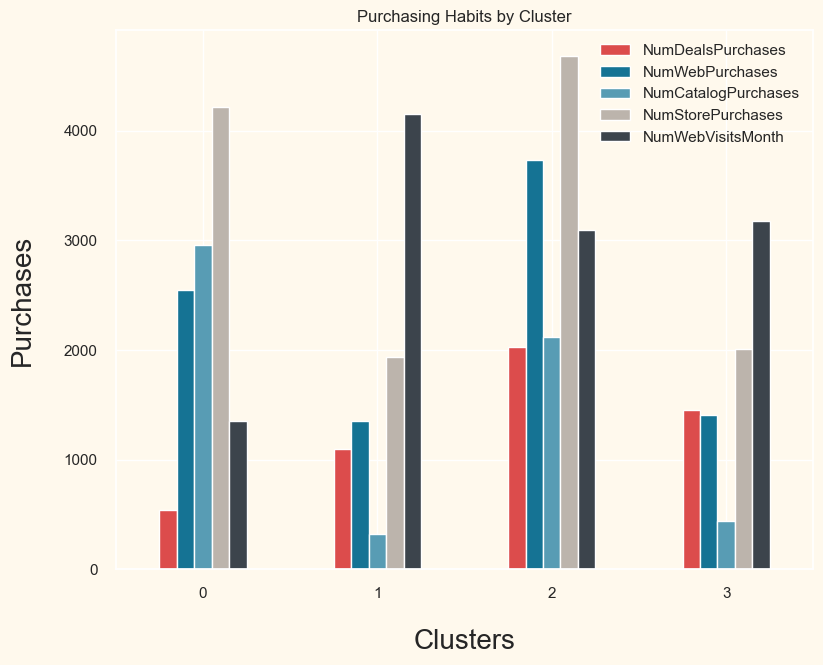

In [740]:
cluster_purchases = customer.groupby('clusters')[['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
                                                  'NumStorePurchases', 'NumWebVisitsMonth']].sum()

cluster_purchases.plot(kind='bar', color=['#dc4c4c','#157394','#589cb4','#bcb4ac','#3c444c'], figsize=(9,7))

plt.title('Purchasing Habits by Cluster')
plt.xlabel('Clusters', fontsize=20, labelpad=20)
plt.ylabel('Purchases', fontsize=20, labelpad=20);
plt.xticks(rotation=0, ha='center');

Agglomerative Clustering
---

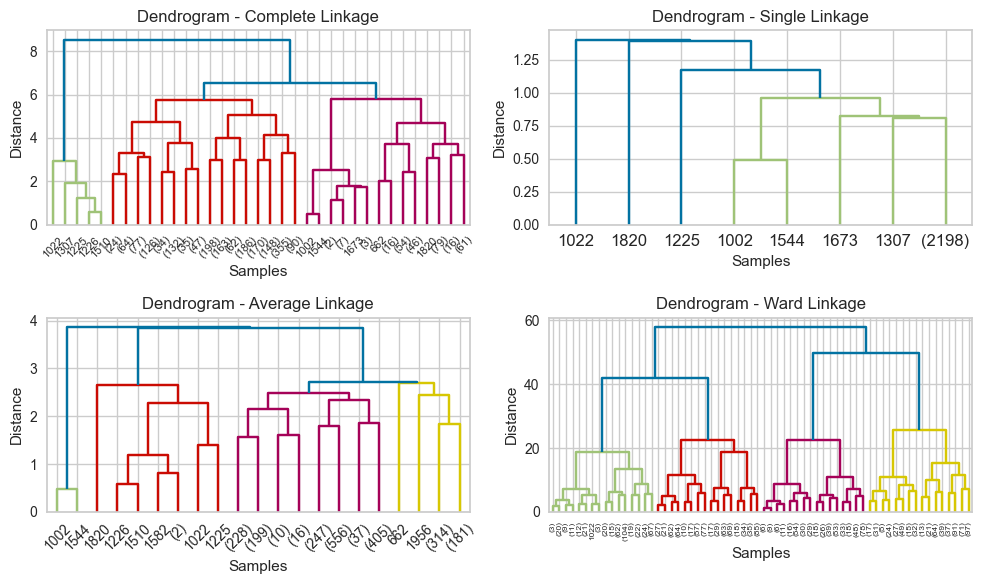

In [33]:
# Load your dataset
df = pd.DataFrame(PCA_ds)  # Your dataset

# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Define the linkage methods
methods = ['complete', 'single', 'average', 'ward']

# Plot the dendrograms side by side
plt.figure(figsize=(10, 6))

for i, method in enumerate(methods, 1):
    linked = linkage(df_scaled, method=method)
    plt.subplot(2, 2, i)
    dendrogram(linked, truncate_mode='level', p=5)
    plt.title(f'Dendrogram - {method.capitalize()} Linkage')
    plt.xlabel('Samples')
    plt.ylabel('Distance')

plt.tight_layout()
plt.show()


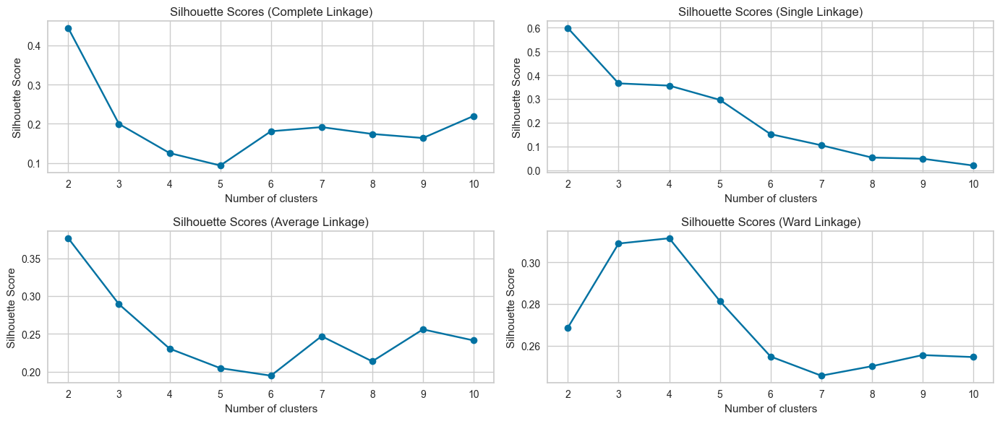

In [34]:
# Load your dataset
df = pd.DataFrame(PCA_ds)  # Your dataset

# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Define the linkage methods
methods = ['complete', 'single', 'average', 'ward']

# Plot the silhouette scores for different linkage methods
plt.figure(figsize=(14, 6))

for i, method in enumerate(methods, 1):
    silhouette_scores = []
    k_range = range(2, 11)  # Typically start from 2 since silhouette score is not defined for 1 cluster
    for k in k_range:
        clustering = AgglomerativeClustering(n_clusters=k, linkage=method)
        cluster_labels = clustering.fit_predict(df_scaled)
        score = silhouette_score(df_scaled, cluster_labels)
        silhouette_scores.append(score)
    
    # Plot the silhouette scores
    plt.subplot(2, 2, i)
    plt.plot(k_range, silhouette_scores, marker='o')
    plt.title(f'Silhouette Scores ({method.capitalize()} Linkage)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')
    plt.grid(True)

plt.tight_layout()
plt.show()


Elbow Method to determine the number of clusters to be formed:


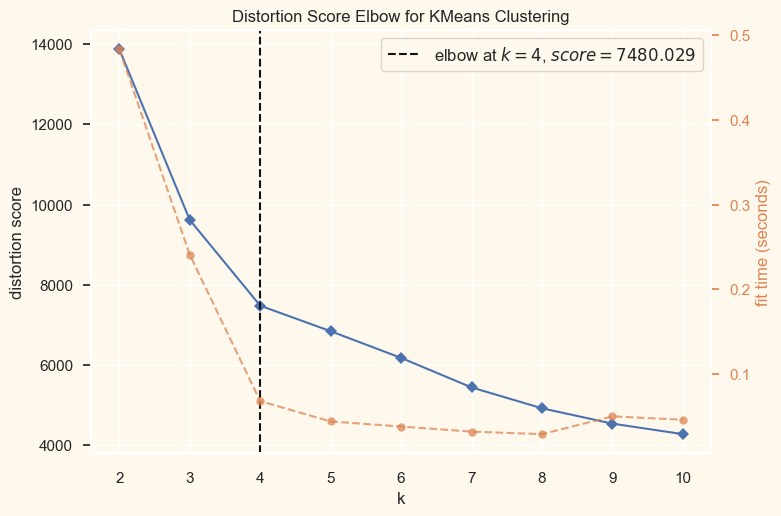

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [744]:
# Quick examination of elbow method to find numbers of clusters to make.
print('Elbow Method to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_ds)
Elbow_M.show()

Single Linkage</br>
The distance between two clusters is defined as the smallest distance between any single point in one cluster and any single point in the other cluster.</br>
Complete Linkage</br>
The distance between two clusters is defined as the largest distance between any single point in one cluster and any single point in the other cluster.</br>
Average Linkage</br>
The distance between two clusters is defined as the average of all pairwise distances between points in one cluster and points in the other cluster.</br>
Ward's Linkage</br>
The distance between two clusters is defined based on the increase in the total within-cluster variance when two clusters are merged.

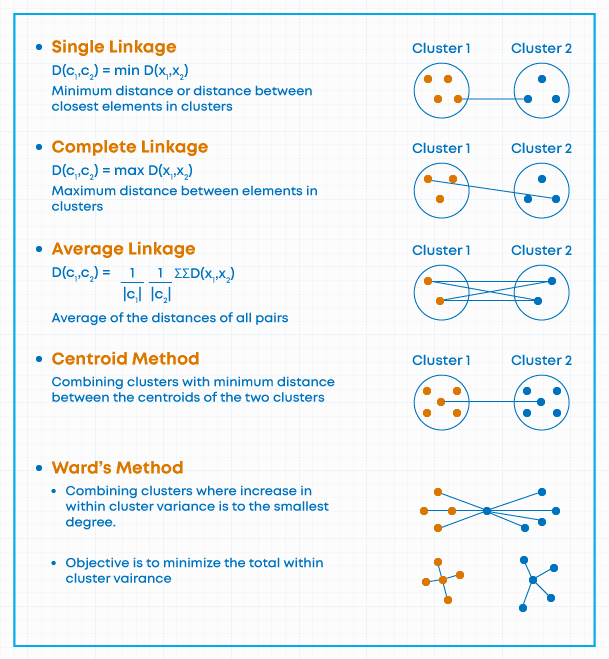

In [2]:
Image(filename='pics/15.png')

In many cases, Ward’s Linkage is preferred as it usually produces better cluster hierarchies</br>
Complete Linkage algorithms are less susceptible to noise and outliers</br>
By the Agglomerative Clustering approach, smaller clusters will be created, which may discover similarities in data</br>

AgglomerativeClustering

In [36]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(linkage = 'complete', n_clusters=2)
# fit model and predict clusters
yhat_AC = AC.fit_predict(PCA_ds)
PCA_ds["Clusters"] = yhat_AC
#Adding the Clusters feature to the orignal dataframe.
data["Clusters"]= yhat_AC

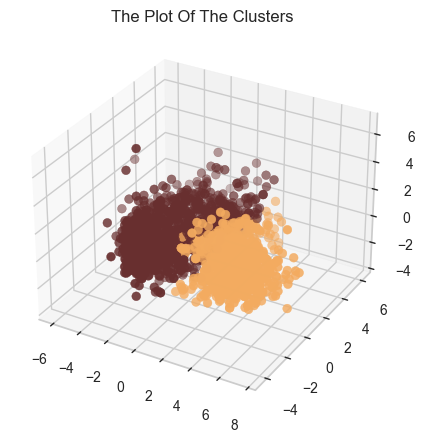

In [37]:
#Plotting the clusters
fig = plt.figure(figsize=(8,5))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_ds["Clusters"], marker='o', cmap = cmap )
ax.set_title("The Plot Of The Clusters")
plt.show()

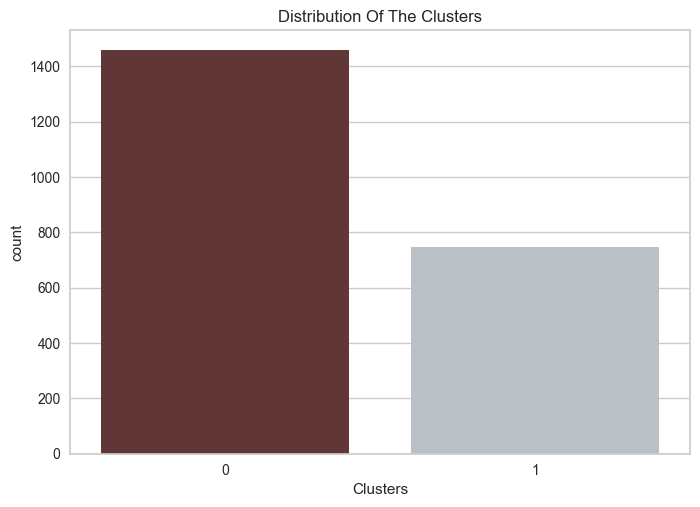

In [39]:
#Plotting countplot of clusters
pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"]
pl = sns.countplot(x=data["Clusters"], palette= pal)
pl.set_title("Distribution Of The Clusters")
plt.show()

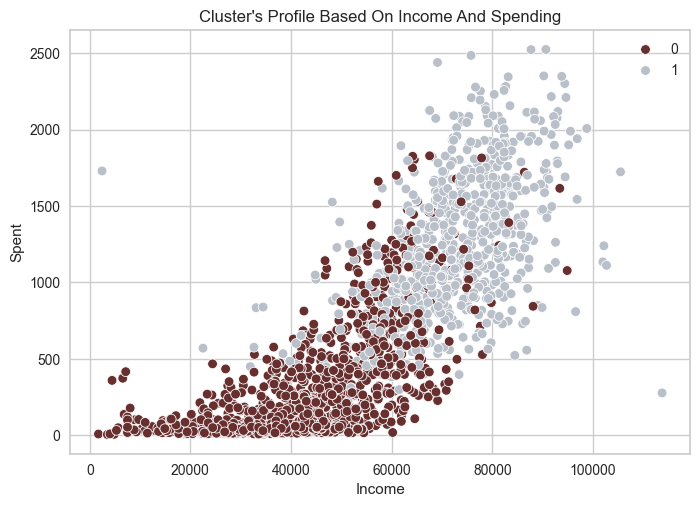

In [40]:
pl = sns.scatterplot(data = data,x=data["Income"], y=data["Spent"],hue=data["Clusters"], palette= pal)
pl.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()
plt.show()

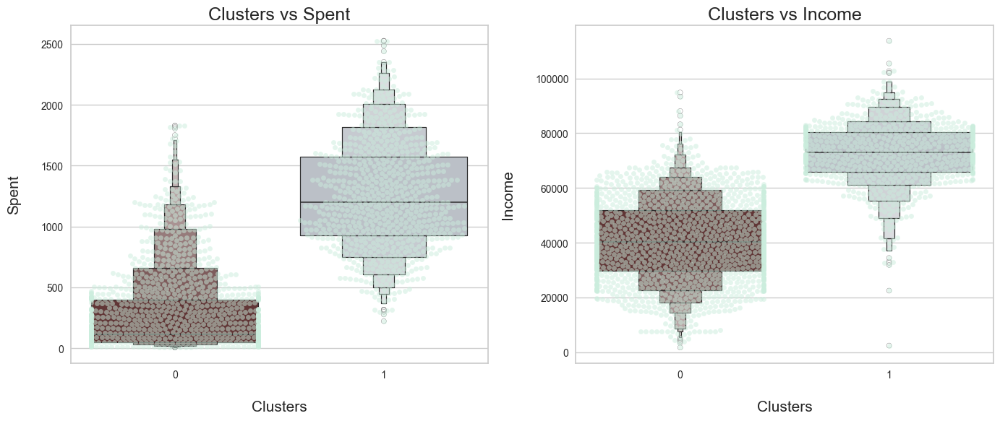

In [42]:
plt.figure(figsize=(14, 6))

# Plot for 'Spent'
plt.subplot(1, 2, 1)
sns.swarmplot(x=data["Clusters"], y=data["Spent"], color="#CBEDDD", alpha=0.5)
sns.boxenplot(x=data["Clusters"], y=data["Spent"], palette=pal)
plt.xlabel('Clusters', fontsize=15, labelpad=20)
plt.ylabel('Spent', fontsize=15, labelpad=20)
plt.title('Clusters vs Spent', fontsize=18)

# Plot for 'Income'
plt.subplot(1, 2, 2)
sns.swarmplot(x=data["Clusters"], y=data["Income"], color="#CBEDDD", alpha=0.5)
sns.boxenplot(x=data["Clusters"], y=data["Income"], palette=pal)
plt.xlabel('Clusters', fontsize=15, labelpad=20)
plt.ylabel('Income', fontsize=15, labelpad=20)
plt.title('Clusters vs Income', fontsize=18)

plt.tight_layout()
plt.show()


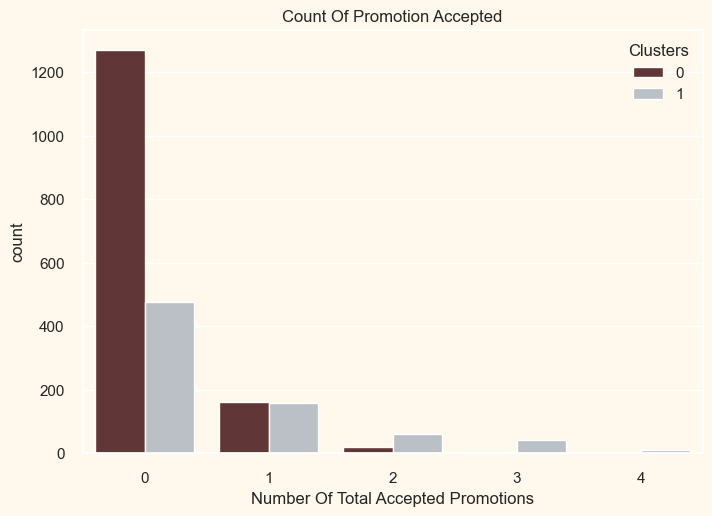

In [ ]:
#Creating a feature to get a sum of accepted promotions 
data["Total_Promos"] = data["AcceptedCmp1"]+ data["AcceptedCmp2"]+ data["AcceptedCmp3"]+ data["AcceptedCmp4"]+ data["AcceptedCmp5"]
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=data["Total_Promos"],hue=data["Clusters"], palette= pal)
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

DBSCAN
---

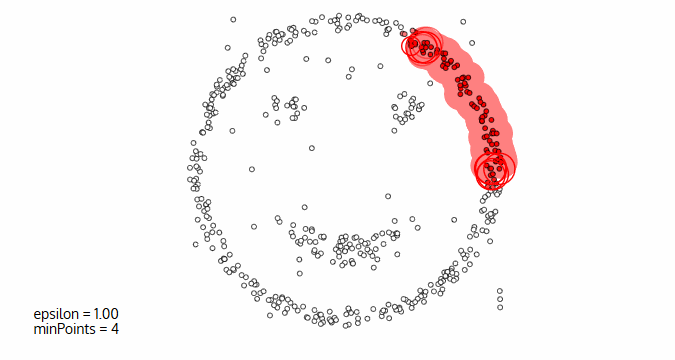

In [42]:
Image(filename='pics/14.gif')

In [193]:
#Create an instance of DBSCAN to create non spherical clusters based on data density
db = DBSCAN(eps=0.8 , min_samples= 8)

#fit to the dimentionality reduced dataset
DP_df =db.fit(PCA_ds2)
#identify the clusters
clusters = db.labels_

# Add the clusters as a new column in the original dataset
data2['Cluster'] = clusters
PCA_ds2['Cluster'] = clusters

#display metrics/sample
n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise_ = list(clusters).count(-1)

print('Cluster Predictions')
print('-------------------------------')
print("Number of clusters: %d" % n_clusters_)
print("Number of noise points: %d" % n_noise_)
print('Number of points per cluster:')
for i in range(n_clusters_):
    print('Cluster', i, ':', len(clusters[clusters==i]))

Cluster Predictions
-------------------------------
Number of clusters: 3
Number of noise points: 141
Number of points per cluster:
Cluster 0 : 1607
Cluster 1 : 452
Cluster 2 : 5


In [155]:
score = silhouette_score(PCA_ds2, clusters, metric='euclidean')
score

0.22826714052124056

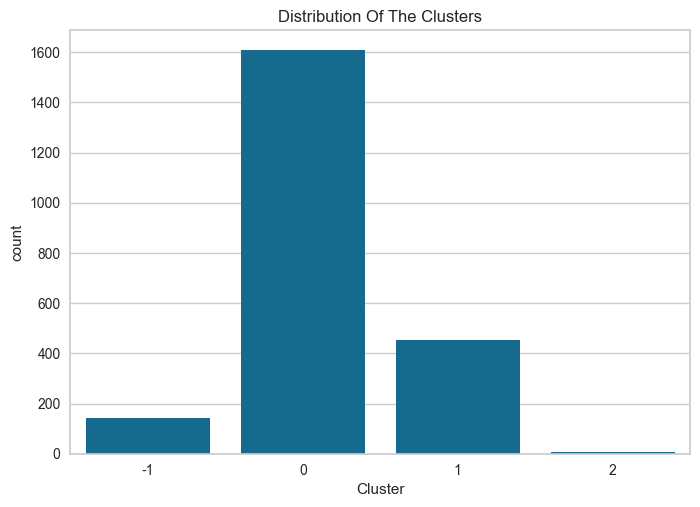

In [156]:
pl = sns.countplot(x=data2["Cluster"])
pl.set_title("Distribution Of The Clusters")
plt.show()

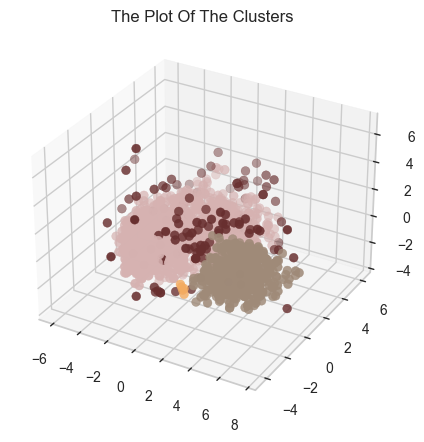

In [158]:
#Plotting the clusters
fig = plt.figure(figsize=(7,5))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_ds2["Cluster"], marker='o', cmap = cmap )
ax.set_title("The Plot Of The Clusters")
plt.show()

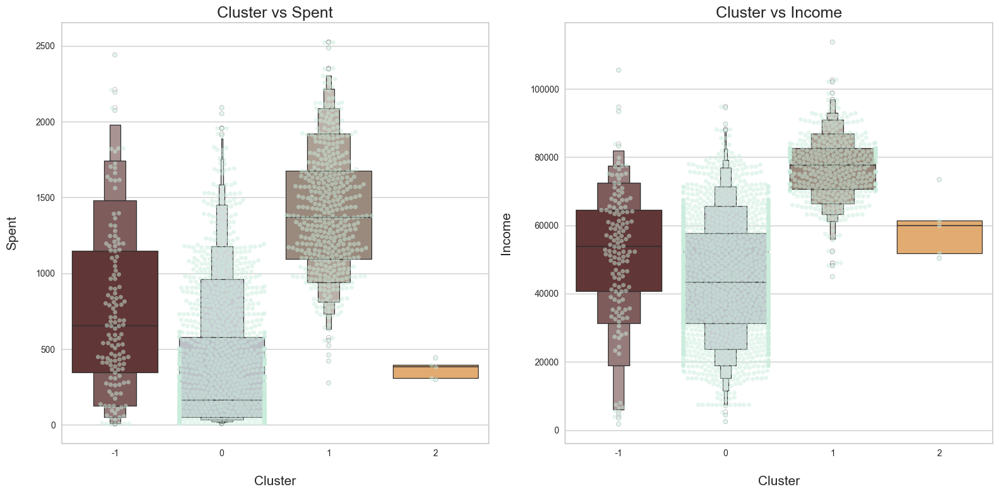

In [159]:
plt.figure(figsize=(16, 8))

# Plot for 'Spent'
plt.subplot(1, 2, 1)
sns.swarmplot(x=data2["Cluster"], y=data2["Spent"], color="#CBEDDD", alpha=0.5)
sns.boxenplot(x=data2["Cluster"], y=data2["Spent"], palette=pal)
plt.xlabel('Cluster', fontsize=15, labelpad=20)
plt.ylabel('Spent', fontsize=15, labelpad=20)
plt.title('Cluster vs Spent', fontsize=18)

# Plot for 'Income'
plt.subplot(1, 2, 2)
sns.swarmplot(x=data2["Cluster"], y=data2["Income"], color="#CBEDDD", alpha=0.5)
sns.boxenplot(x=data2["Cluster"], y=data2["Income"], palette=pal)
plt.xlabel('Cluster', fontsize=15, labelpad=20)
plt.ylabel('Income', fontsize=15, labelpad=20)
plt.title('Cluster vs Income', fontsize=18)

plt.tight_layout()
plt.show()

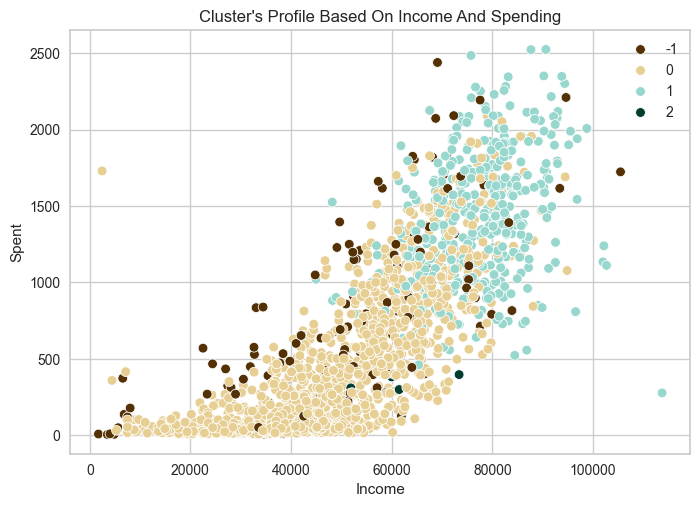

In [160]:
pl = sns.scatterplot(data = data2,x=data2["Income"], y=data2["Spent"],hue=data2["Cluster"], palette= 'BrBG')
pl.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()
plt.show()

(array([0, 1, 2, 3]),
 [Text(0, 0, '-1'), Text(1, 0, '0'), Text(2, 0, '1'), Text(3, 0, '2')])

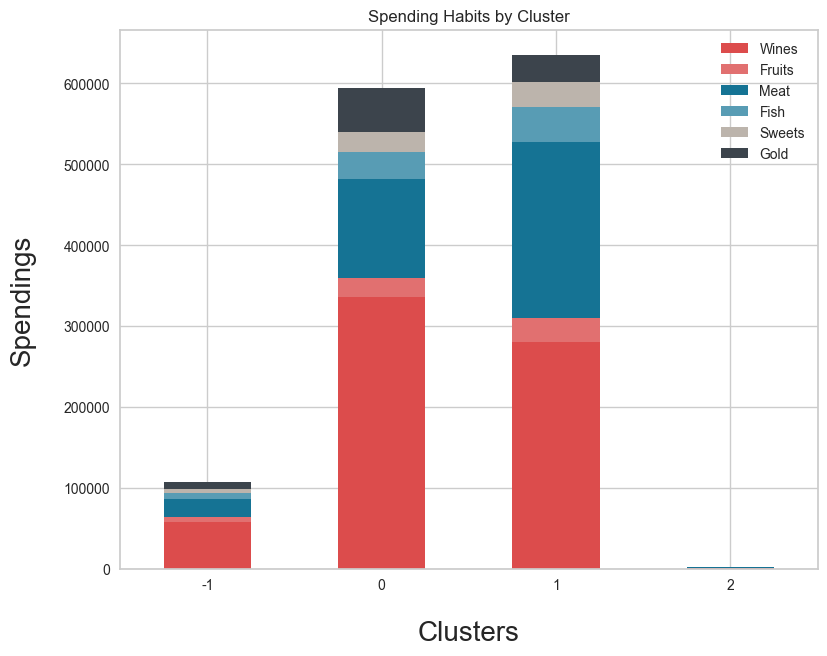

In [197]:
cluster_spendings = data2.groupby('Cluster')[['Wines', 'Fruits','Meat', 
                                                  'Fish', 'Sweets', 'Gold']].sum()

cluster_spendings.plot(kind='bar', stacked=True, figsize=(9,7), color=['#dc4c4c','#e17070','#157394','#589cb4','#bcb4ac','#3c444c'])

plt.title('Spending Habits by Cluster')
plt.xlabel('Clusters', fontsize=20, labelpad=20)
plt.ylabel('Spendings', fontsize=20, labelpad=20)
plt.xticks(rotation=0, ha='center')

Grid-Based
---
STING

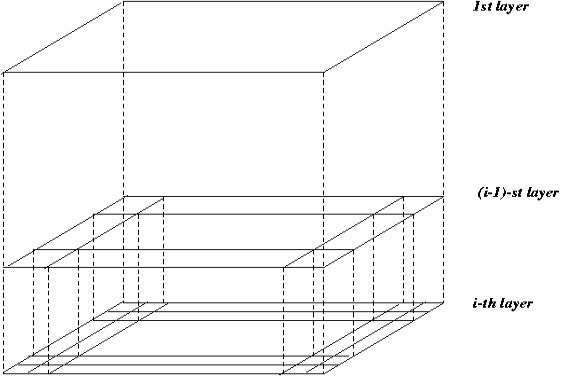

In [45]:
Image(filename='pics/11.jpg')

   cell_col1  cell_col2  cell_col3  mean_col1  mean_col2  mean_col3  var_col1  \
0       -1.0       -1.0       -1.0  -0.775456  -0.719001  -0.638373  0.083901   
1       -1.0       -1.0        0.0  -0.764446  -0.997327   0.810562  0.076591   
2       -1.0        0.0       -1.0  -0.843690   0.609389  -0.956141  0.183832   
3       -1.0        0.0        0.0  -0.598211   0.968357   0.856054  0.144245   
4        0.0       -1.0       -1.0   1.361360  -0.669807  -0.759630  0.231013   
5        0.0       -1.0        0.0   1.296161  -0.657332   0.777982  0.308812   
6        0.0        0.0       -1.0   0.670643   0.884435  -0.722267  0.331311   
7        0.0        0.0        0.0   0.642536   1.152748   0.830666  0.233474   

   var_col2  var_col3  cluster  
0  0.249321  0.252684        0  
1  0.294798  0.437538        2  
2  0.275222  0.403951        0  
3  0.467082  0.423622        0  
4  0.132323  0.266078        1  
5  0.155899  0.332374        1  
6  0.273084  0.264999        0  
7  0.3

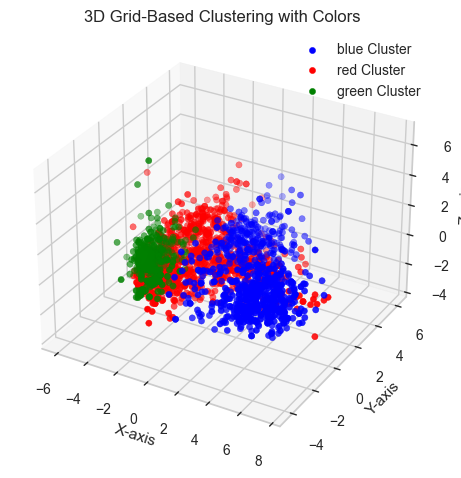

In [ ]:
# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(PCA_ds3)

# Convert the standardized data back to a DataFrame
X_scaled_df = pd.DataFrame(X_scaled, columns=['col1', 'col2', 'col3'])

# Divide data into cells
cell_size = 20
X_scaled_df['cell_col1'] = np.floor(X_scaled_df['col1'] / cell_size)
X_scaled_df['cell_col2'] = np.floor(X_scaled_df['col2'] / cell_size)
X_scaled_df['cell_col3'] = np.floor(X_scaled_df['col3'] / cell_size)

# Calculate statistics for each cell
cell_stats = X_scaled_df.groupby(['cell_col1', 'cell_col2', 'cell_col3']).agg(
    mean_col1=('col1', 'mean'),
    mean_col2=('col2', 'mean'),
    mean_col3=('col3', 'mean'),
    var_col1=('col1', 'var'),
    var_col2=('col2', 'var'),
    var_col3=('col3', 'var')
).reset_index()

# Clustering the cells using KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(cell_stats[['mean_col1', 'mean_col2', 'mean_col3']])

# Add cluster labels to cell_stats
cell_stats['cluster'] = kmeans.labels_
print(cell_stats)

# Map each original data point to its cluster
def get_cluster_id(row):
    cell = (np.floor(row['col1'] / cell_size), np.floor(row['col2'] / cell_size), np.floor(row['col3'] / cell_size))
    cluster_row = cell_stats[(cell_stats['cell_col1'] == cell[0]) & (cell_stats['cell_col2'] == cell[1]) & (cell_stats['cell_col3'] == cell[2])]
    if not cluster_row.empty:
        return cluster_row['cluster'].values[0]
    else:
        return -1  # If the cell does not belong to any cluster

PCA_ds3['Cluster'] = PCA_ds3.apply(get_cluster_id, axis=1)
data3['Cluster'] = PCA_ds3.apply(get_cluster_id, axis=1)
# Print the modified dataset


# Calculate Silhouette Score
if len(np.unique(PCA_ds3['Cluster'])) > 1:
    silhouette_avg = silhouette_score(X_scaled, PCA_ds3['Cluster'])
    print(f"Silhouette Score: {silhouette_avg:.3f}")
else:
    print("Silhouette Score cannot be calculated for a single cluster.")

# Assign colors to clusters
colors = ['red', 'blue', 'green', 'purple', 'orange']
color_map = {i: colors[i % len(colors)] for i in range(len(np.unique(PCA_ds3['Cluster'])))}

# Map colors to the clusters
PCA_ds3['Color'] = PCA_ds3['Cluster'].map(lambda x: color_map.get(x, 'gray'))

# Plot data points with their assigned colors
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
for color in PCA_ds3['Color'].unique():
    cluster_data = PCA_ds3[PCA_ds3['Color'] == color]
    ax.scatter(cluster_data['col1'], cluster_data['col2'], cluster_data['col3'], color=color, label=f'{color} Cluster')

ax.set_title('3D Grid-Based Clustering with Colors')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.legend()
plt.show()


In [164]:
# Remove noise points (Cluster == -1) from silhouette score calculation
valid_indices = PCA_ds3[PCA_ds3['Cluster'] != -1].index
valid_data = X_scaled[valid_indices]
valid_clusters = PCA_ds3.loc[valid_indices, 'Cluster']

# Calculate Silhouette Score if there are at least 2 clusters
silhouette_avg = silhouette_score(valid_data, valid_clusters)
print(f"Silhouette Score: {silhouette_avg:.3f}")



Silhouette Score: 0.215


compare methods:</br>
kmeans:</br>
Silhouette Score: 0.44</br>

Agglomerative Clustering:</br>
Silhouette Score: 0.45</br>

DBSCAN:</br>
Silhouette Score: 0.22</br>

Sting:</br>
Silhouette Score: 0.215</br>
